In [2]:
import pandas as pd
import numpy as np

# open training file
dfPath = r'UNSW_NB15_training-set.csv'
df= pd.read_csv(dfPath)

# see how a single row looks
print(df.iloc[0])

# Open test file
df_test = pd.read_csv("UNSW_NB15_testing-set.csv")

# merge training set and the test set
df_all = pd.concat([df, df_test], ignore_index=True)

# give the catogorical 
columns_all = df_all.columns
for column in columns_all:
    if(type(df_all[column][0]) == type("")):
        df_all[column] = pd.factorize(df_all[column])[0]
        unique_values_all = df_all[column].unique()

print(df_all['attack_cat'].value_counts())
print(df_all['proto'].value_counts())
print(df_all['service'].value_counts())


df = df_all.iloc[:len(df)]
df_test = df_all.iloc[len(df):]

id                             1
dur                     0.121478
proto                        tcp
service                        -
state                        FIN
spkts                          6
dpkts                          4
sbytes                       258
dbytes                       172
rate                    74.08749
sttl                         252
dttl                         254
sload                14158.94238
dload                8495.365234
sloss                          0
dloss                          0
sinpkt                   24.2956
dinpkt                     8.375
sjit                   30.177547
djit                   11.830604
swin                         255
stcpb                  621772692
dtcpb                 2202533631
dwin                         255
tcprtt                       0.0
synack                       0.0
ackdat                       0.0
smean                         43
dmean                         43
trans_depth                    0
response_b

In [3]:
# See the disturbtion of classes
print(df['attack_cat'].value_counts())

0    56000
9    40000
6    33393
3    18184
7    12264
5    10491
2     2000
1     1746
4     1133
8      130
Name: attack_cat, dtype: int64


In [4]:
# dropping the id column
df = df.drop(['id'], axis = 1)

In [5]:
# dropping the minority classes as the paper
df = df.drop(df[df['attack_cat'] == 1].index)
df = df.drop(df[df['attack_cat'] == 2].index)
df = df.drop(df[df['attack_cat'] == 4].index)
df = df.drop(df[df['attack_cat'] == 8].index)


In [6]:
# check the classes again
print(df['attack_cat'].value_counts())

0    56000
9    40000
6    33393
3    18184
7    12264
5    10491
Name: attack_cat, dtype: int64


In [7]:
# We check for missing values.
# Check if any rows have null values
null_rows = df.isnull().any(axis=1)
print('Number of rows with null values:', sum(null_rows))


Number of rows with null values: 0


In [8]:
duplicate_rows = df[df.duplicated()]
print("Number of duplicate rows: ", len(duplicate_rows))


# That's a lot of duplicated values! but they make sense as they will be discussed in the report


Number of duplicate rows:  66939


In [9]:
# the following three blocks will discuss why dont we use onehot coding
cols = df.columns
num_cols = df._get_numeric_data().columns
print(set(cols)- set(num_cols))


set()


In [10]:
df_service = pd.get_dummies(df['service'])
df_state = pd.get_dummies(df['state'])
df_proto = pd.get_dummies(df['proto'])
print(df_service)
print(df_state)
print(df_proto)

        0   1   2   3   4   5   6   7   8   9   10  11  12
0        1   0   0   0   0   0   0   0   0   0   0   0   0
1        1   0   0   0   0   0   0   0   0   0   0   0   0
2        1   0   0   0   0   0   0   0   0   0   0   0   0
3        0   1   0   0   0   0   0   0   0   0   0   0   0
4        1   0   0   0   0   0   0   0   0   0   0   0   0
...     ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..
175335   0   0   0   0   0   0   1   0   0   0   0   0   0
175336   0   0   0   0   0   0   1   0   0   0   0   0   0
175338   0   0   0   0   0   0   1   0   0   0   0   0   0
175339   0   0   0   0   0   0   1   0   0   0   0   0   0
175340   0   0   0   0   0   0   1   0   0   0   0   0   0

[170332 rows x 13 columns]
        0  1  2  3  4  5  6  7  8
0       1  0  0  0  0  0  0  0  0
1       1  0  0  0  0  0  0  0  0
2       1  0  0  0  0  0  0  0  0
3       1  0  0  0  0  0  0  0  0
4       1  0  0  0  0  0  0  0  0
...    .. .. .. .. .. .. .. .. ..
175335  0  1  0  0  0  0  

In [11]:
print(df)

             dur  proto  service  state  spkts  dpkts  sbytes  dbytes  \
0       0.121478      0        0      0      6      4     258     172   
1       0.649902      0        0      0     14     38     734   42014   
2       1.623129      0        0      0      8     16     364   13186   
3       1.681642      0        1      0     12     12     628     770   
4       0.449454      0        0      0     10      6     534     268   
...          ...    ...      ...    ...    ...    ...     ...     ...   
175335  0.000006      1        6      1      2      0     114       0   
175336  0.000009      1        6      1      2      0     114       0   
175338  0.000009      1        6      1      2      0     114       0   
175339  0.000009      1        6      1      2      0     114       0   
175340  0.000009      1        6      1      2      0     114       0   

                 rate  sttl  ...  ct_src_dport_ltm  ct_dst_sport_ltm  \
0           74.087490   252  ...                 1 

In [12]:
# Now we want normalize our data
# We will use MinMax normalization instead of standard one
# reasons will be thoroughly explained in the report

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
exclude_columns = ['attack_cat']
columns_to_scale = [col for col in df.columns if col not in exclude_columns]

df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])

print(df)

                 dur     proto   service  state     spkts     dpkts    sbytes  \
0       2.024634e-03  0.000000  0.000000  0.000  0.000520  0.000364  0.000018   
1       1.083170e-02  0.000000  0.000000  0.000  0.001352  0.003463  0.000054   
2       2.705215e-02  0.000000  0.000000  0.000  0.000728  0.001458  0.000026   
3       2.802737e-02  0.000000  0.083333  0.000  0.001144  0.001093  0.000046   
4       7.490901e-03  0.000000  0.000000  0.000  0.000936  0.000547  0.000039   
...              ...       ...       ...    ...       ...       ...       ...   
175335  1.000000e-07  0.007576  0.500000  0.125  0.000104  0.000000  0.000007   
175336  1.500000e-07  0.007576  0.500000  0.125  0.000104  0.000000  0.000007   
175338  1.500000e-07  0.007576  0.500000  0.125  0.000104  0.000000  0.000007   
175339  1.500000e-07  0.007576  0.500000  0.125  0.000104  0.000000  0.000007   
175340  1.500000e-07  0.007576  0.500000  0.125  0.000104  0.000000  0.000007   

          dbytes      rate 

In [13]:
# dividing data to X and y 
y_train = df['attack_cat']
df.drop(['attack_cat'], axis = 1, inplace = True)
x_train = df
print(y_train)
print(x_train)

0         0
1         0
2         0
3         0
4         0
         ..
175335    9
175336    9
175338    9
175339    9
175340    9
Name: attack_cat, Length: 170332, dtype: int64
                 dur     proto   service  state     spkts     dpkts    sbytes  \
0       2.024634e-03  0.000000  0.000000  0.000  0.000520  0.000364  0.000018   
1       1.083170e-02  0.000000  0.000000  0.000  0.001352  0.003463  0.000054   
2       2.705215e-02  0.000000  0.000000  0.000  0.000728  0.001458  0.000026   
3       2.802737e-02  0.000000  0.083333  0.000  0.001144  0.001093  0.000046   
4       7.490901e-03  0.000000  0.000000  0.000  0.000936  0.000547  0.000039   
...              ...       ...       ...    ...       ...       ...       ...   
175335  1.000000e-07  0.007576  0.500000  0.125  0.000104  0.000000  0.000007   
175336  1.500000e-07  0.007576  0.500000  0.125  0.000104  0.000000  0.000007   
175338  1.500000e-07  0.007576  0.500000  0.125  0.000104  0.000000  0.000007   
175339  1.5

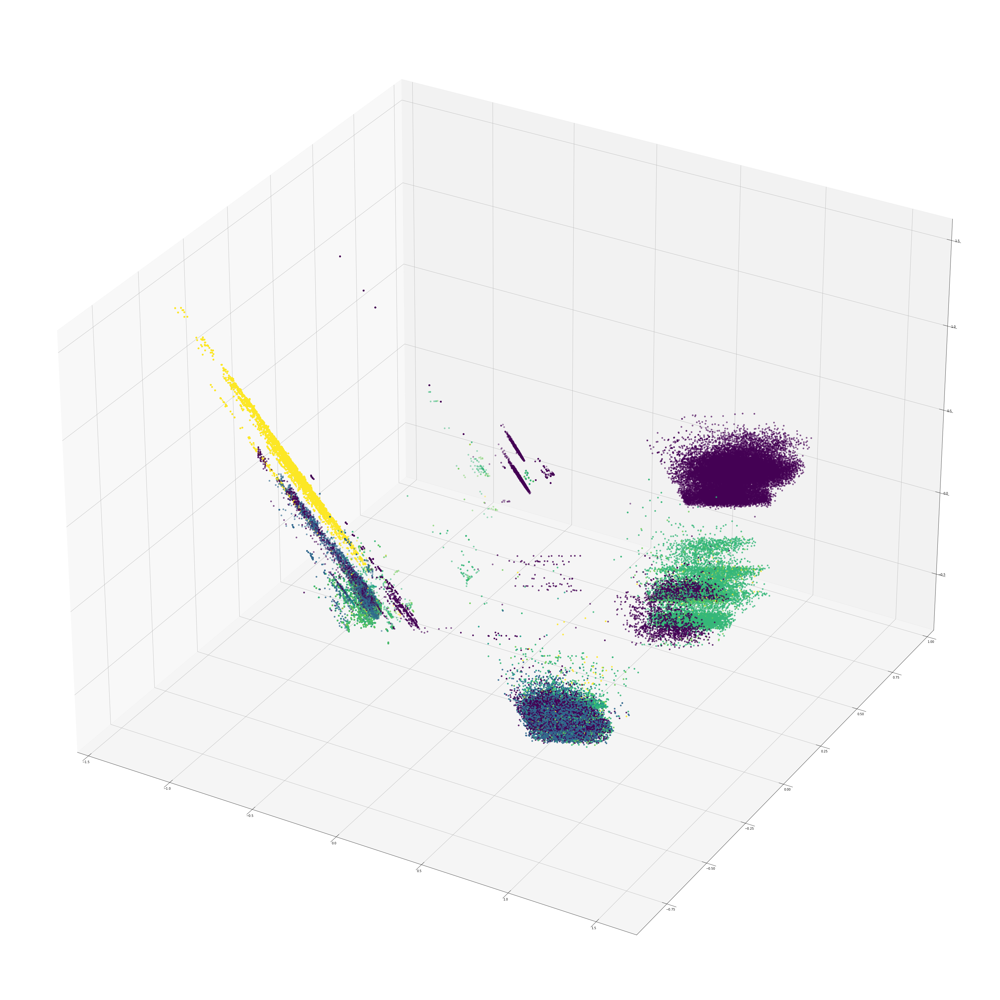

In [14]:
# Plotting our normal data

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=3)  
reduced_data = pca.fit_transform(x_train)

fig = plt.figure(figsize = (80, 60))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reduced_data[:, 0], reduced_data[:, 1], reduced_data[:, 2], c = y_train )

In [255]:
# Now, our objective is to decrease the dimensionality of the data since we intend to input it into a system.
# Following the recommendations in the paper, we will adopt a supervised method to accomplish data reduction.

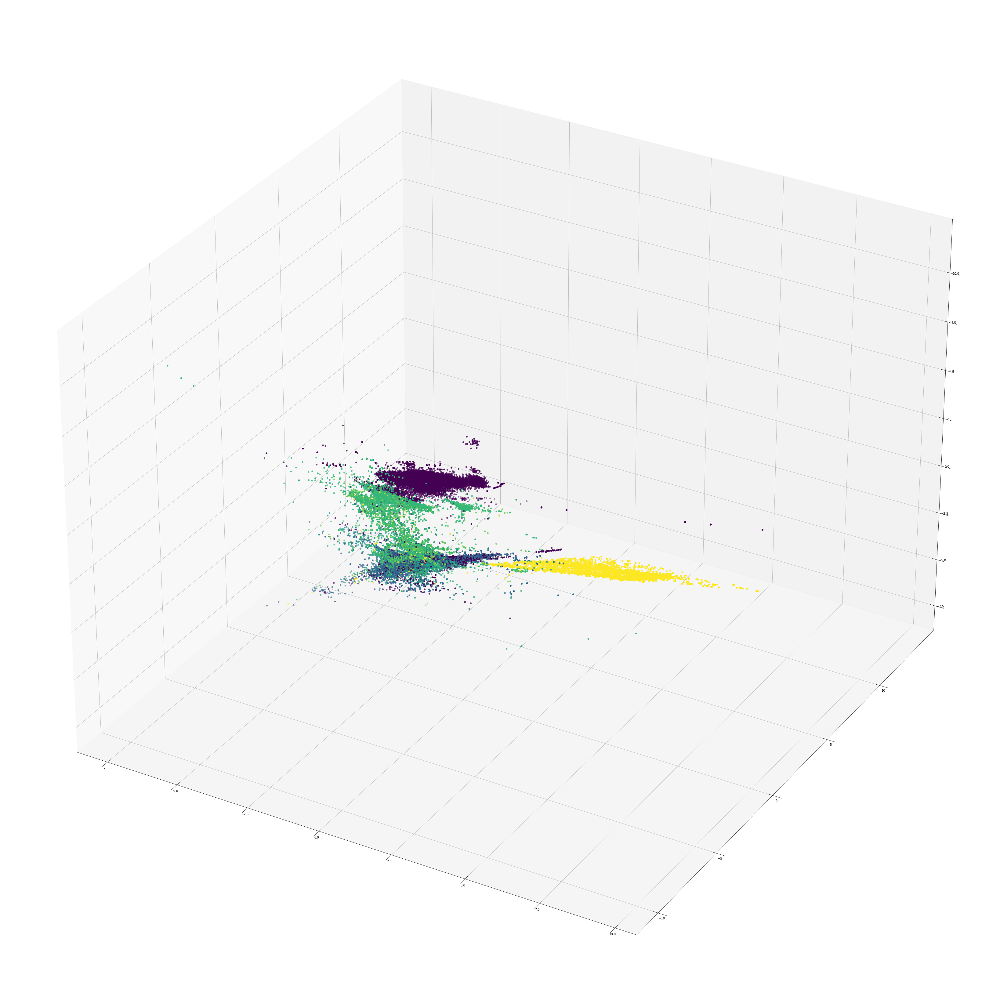

In [15]:
#LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
lda = LinearDiscriminantAnalysis(n_components=4)
lda.fit(x_train, y_train)
X_lda = lda.transform(x_train)

pca2 = PCA(n_components=3)  
reduced_data2 = pca2.fit_transform(X_lda)

fig = plt.figure(figsize = (80, 60))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reduced_data2[:, 0], reduced_data2[:, 1], reduced_data2[:, 2], c = y_train )


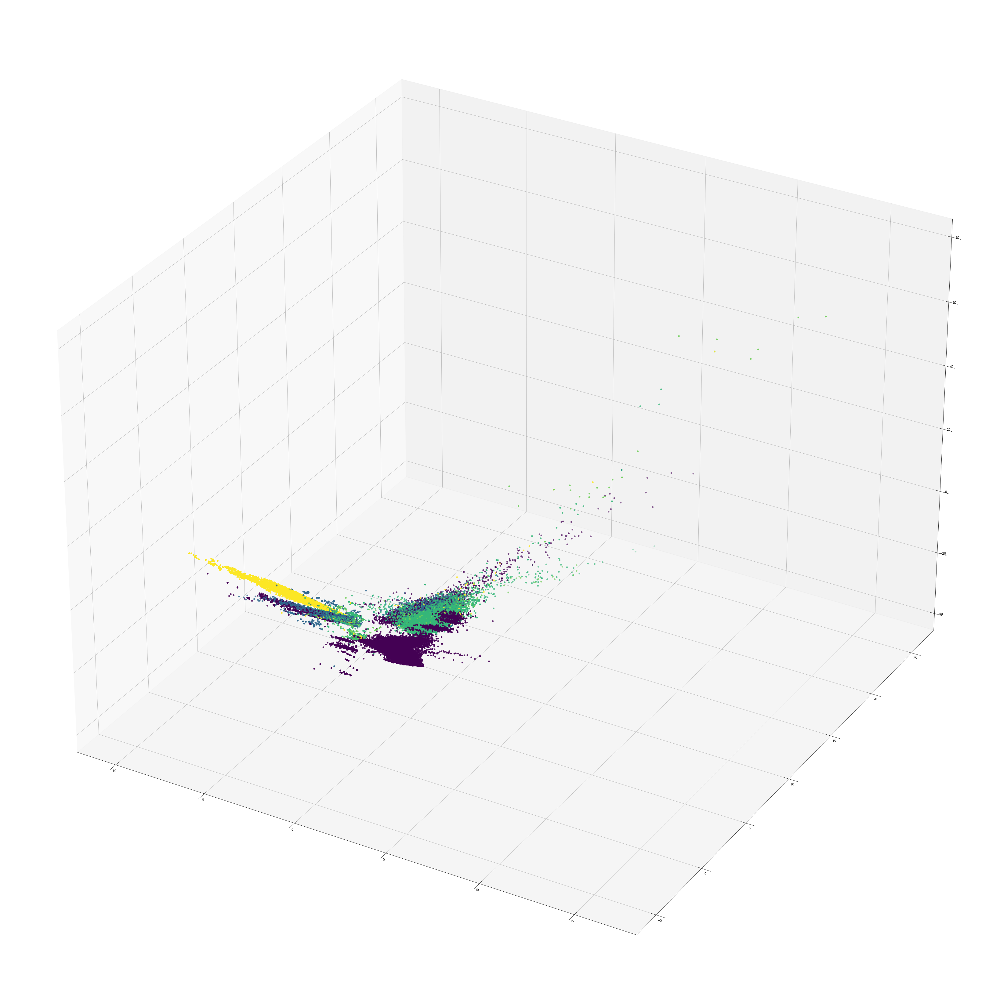

In [16]:
# Perform Partial Least Squares regression

from sklearn.cross_decomposition import PLSRegression
pls = PLSRegression(n_components=6)  # Specify the desired number of components
pls.fit(x_train, y_train)
x_pls = pls.transform(x_train)

pca3 = PCA(n_components=3)  
reduced_data3 = pca3.fit_transform(x_pls)

fig = plt.figure(figsize = (80, 60))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reduced_data3[:, 0], reduced_data3[:, 1], reduced_data3[:, 2], c = y_train )

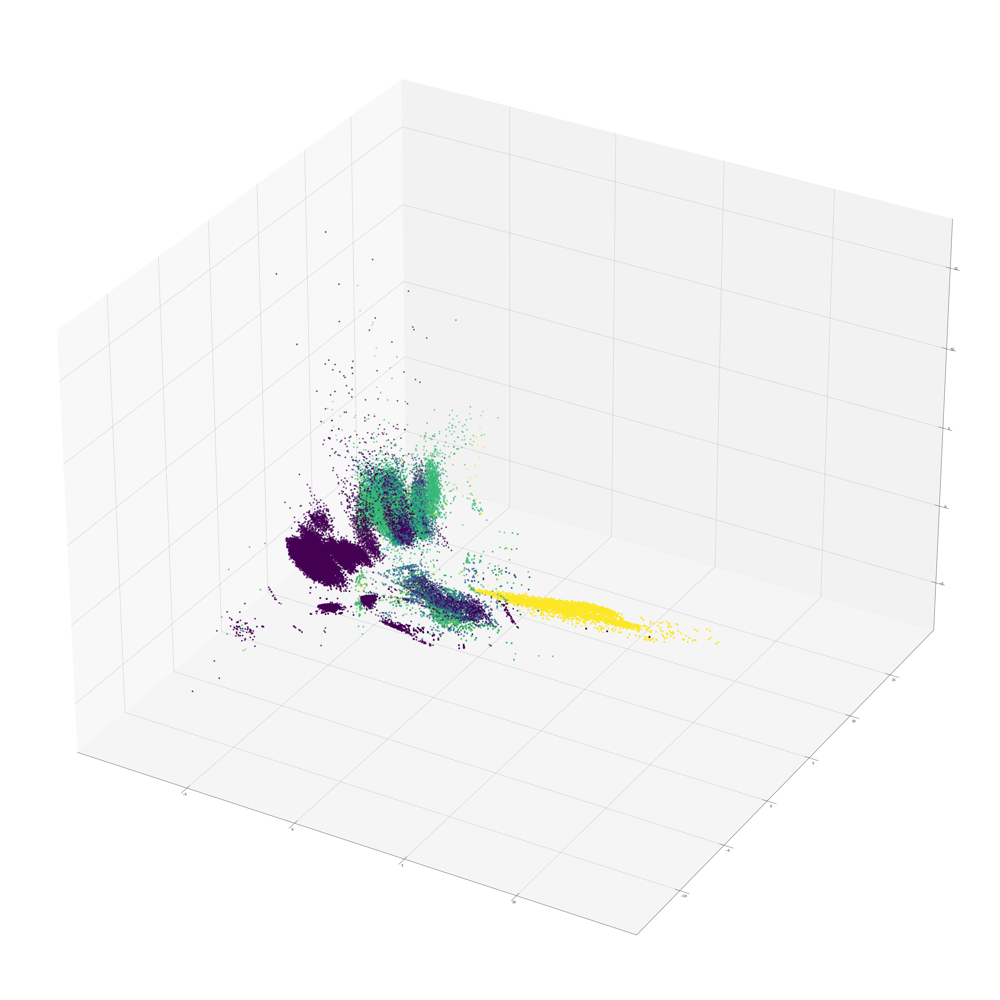

In [41]:
# Union of LDA and PLS
import numpy as np

concatenated_array = np.concatenate((X_lda, x_pls), axis=1)
pca4 = PCA(n_components=3)  
reduced_data4 = pca4.fit_transform(concatenated_array)

fig = plt.figure(figsize = (80, 60))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reduced_data4[:, 0], reduced_data4[:, 1], reduced_data4[:, 2], c = y_train )

In [26]:
# We're going to use feature selection methods
# RFE
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier


estimator = RandomForestClassifier(n_jobs = -1)


n_features_to_select = 10  
selector = RFE(estimator, n_features_to_select=10)


X_selected = selector.fit_transform(x_train, y_train)

selected_indices = selector.get_support(indices=True)


In [27]:
print(selected_indices)

[ 6  8  9 12 26 31 33 34 35 40]


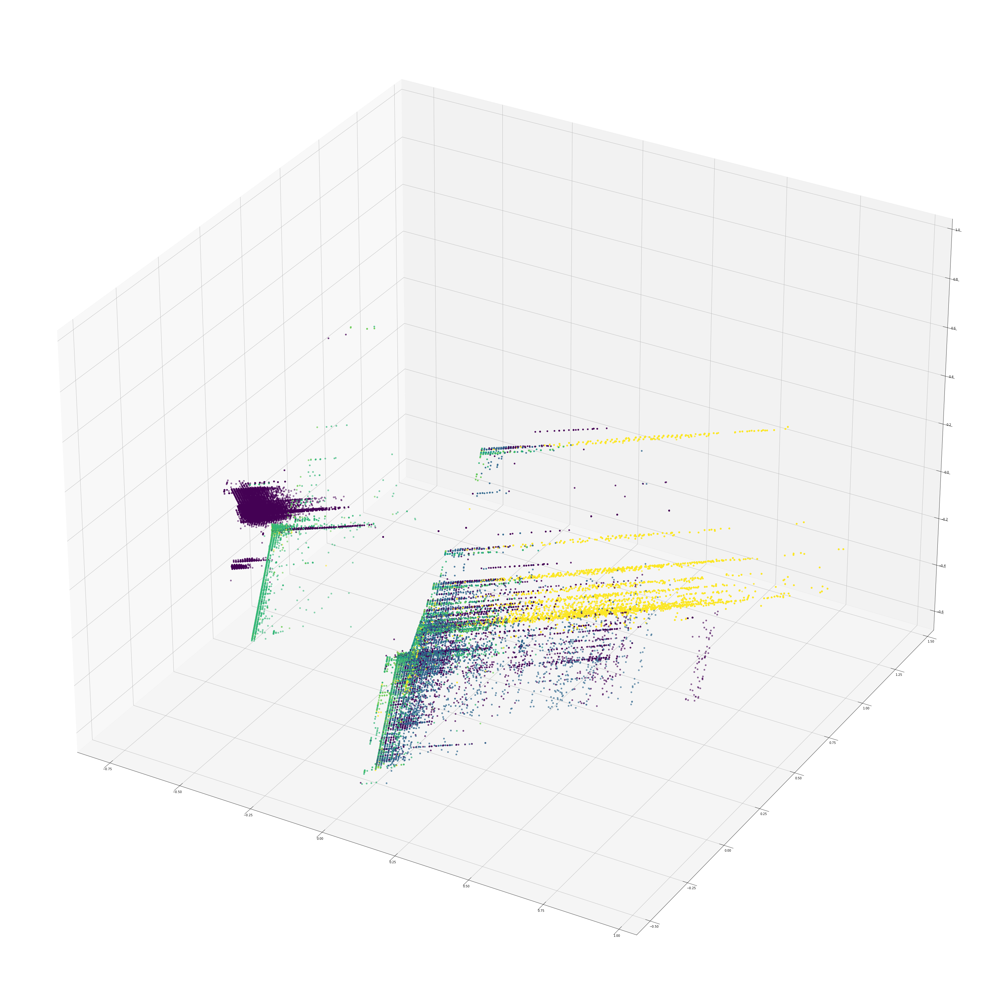

In [28]:
X_selected = x_train.iloc[:, selected_indices]
pca5 = PCA(n_components=3)  
reduced_data5 = pca5.fit_transform(X_selected)

fig = plt.figure(figsize = (80, 60))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reduced_data5[:, 0], reduced_data5[:, 1], reduced_data5[:, 2], c = y_train )

In [29]:
# SelectFromModel
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression

estimator = LogisticRegression(penalty='l1', solver='liblinear')


selector = SelectFromModel(estimator, max_features = 10)

X_selected = selector.fit_transform(x_train, y_train)

selected_indices = selector.get_support(indices=True)
print(selected_indices)

[ 1  3 12 13 24 27 28 33 34 40]


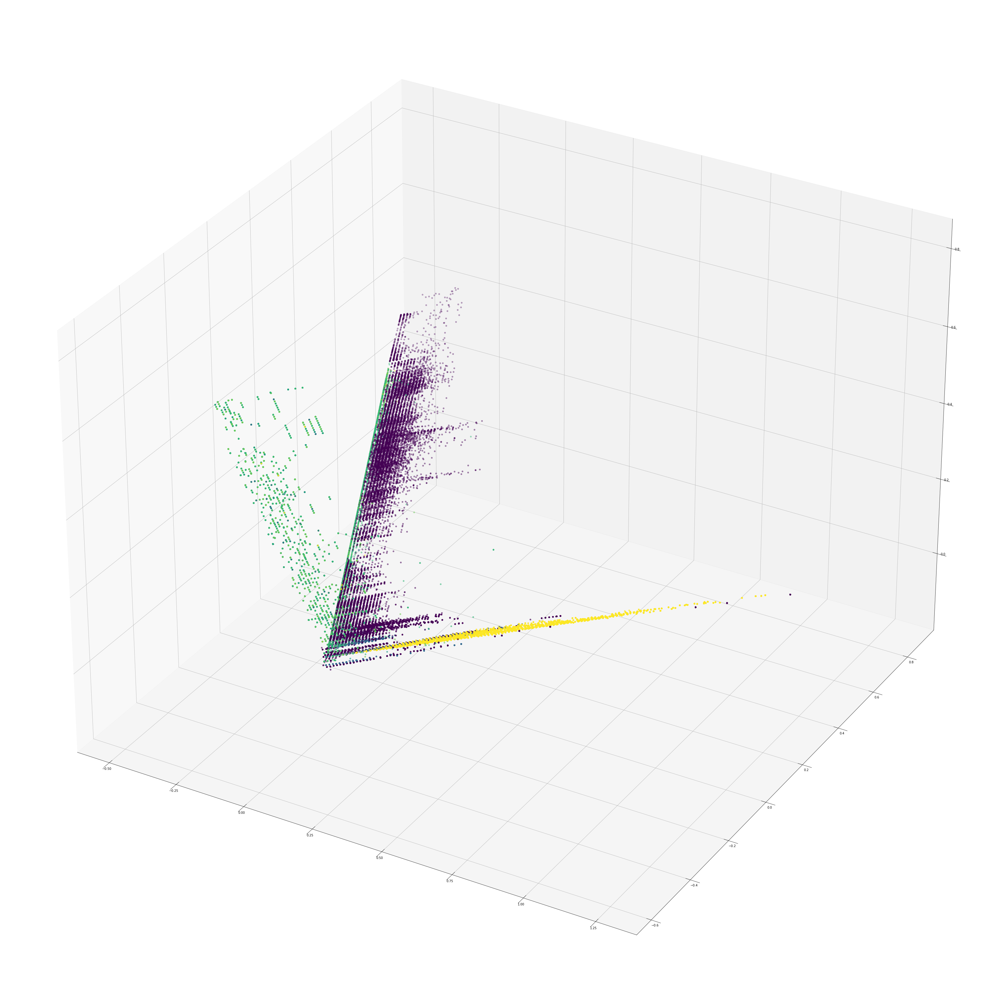

In [30]:
X_selected2 = x_train.iloc[:, selected_indices]
pca6 = PCA(n_components=3)  
reduced_data6 = pca6.fit_transform(X_selected2)

fig = plt.figure(figsize = (80, 60))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reduced_data6[:, 0], reduced_data6[:, 1], reduced_data6[:, 2], c = y_train )

16


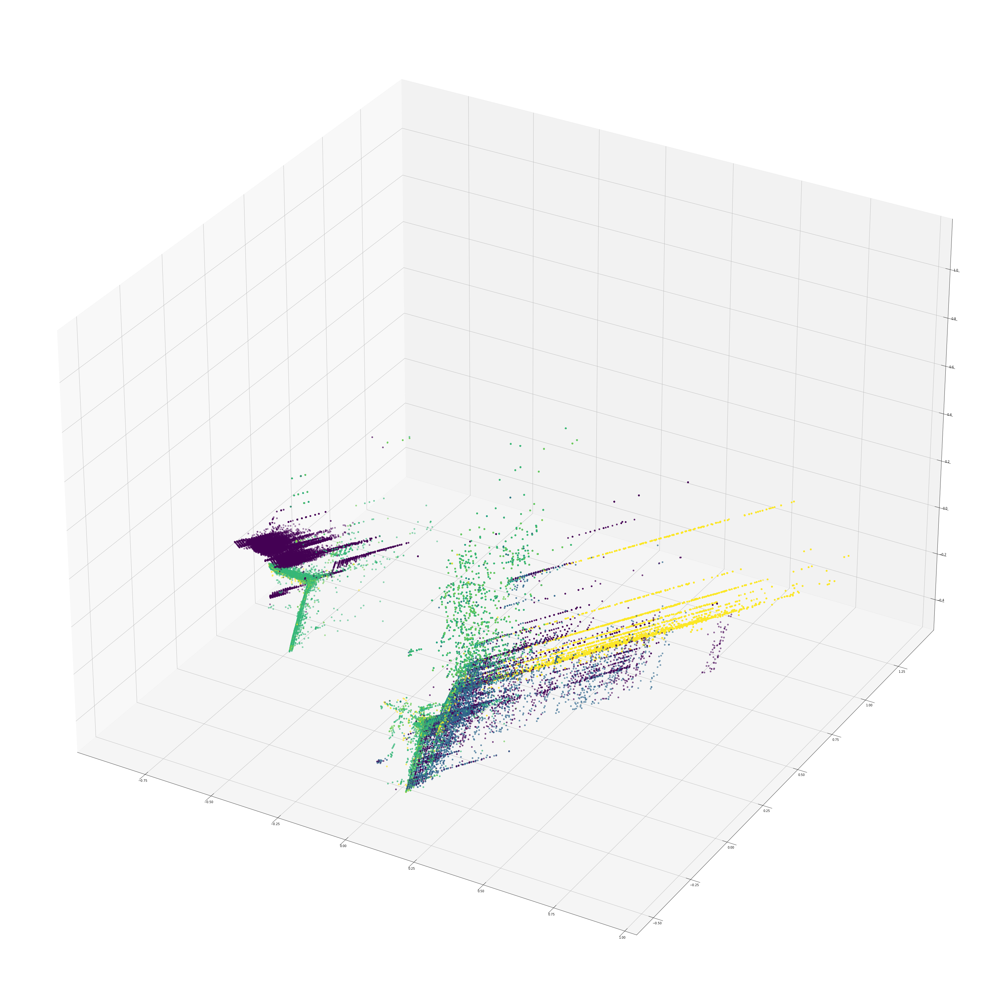

In [18]:
# Union of these two featureselecting models
selected_cols = set([6,8, 9, 12, 26, 31, 33, 34, 35, 40, 1 ,3 ,12 ,13 ,24 ,27 ,28 ,33 ,34 ,40])

print(len(selected_cols))

X_selected3 = x_train.iloc[:, list(selected_cols)]

pca7 = PCA(n_components=3)  
reduced_data7 = pca7.fit_transform(X_selected3)

fig = plt.figure(figsize = (80, 60))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reduced_data7[:, 0], reduced_data7[:, 1], reduced_data7[:, 2], c = y_train )

In [38]:
#It's time to train models
# I'm going to use cvFold to find the best hyper parameters for my training set and then use them for my test set
# Randomforest for lda and pls
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, make_scorer

df_lda_pls = pd.DataFrame(concatenated_array)
print(df_lda_pls.shape)
scorer = make_scorer(f1_score, average='weighted')
i = 0
best_params = {}
best_score = 0
for n in [100 , 150]:
    for criterion in ['gini', 'entropy']:
        for  min_split in [2, 5]:
            print(i)
            i = +1
            RandomForest = RandomForestClassifier(n_jobs = -1, n_estimators = n ,criterion = criterion, min_samples_split = min_split)
            scores = cross_val_score(RandomForest ,df_lda_pls, y_train, cv=5,scoring=scorer)
            average_score = scores.mean()

            if average_score > best_score:
                best_score = average_score
                best_params = {'n' : n , 'criterion':criterion , 'min_samples_split' : min_split}

print(f"Best Hyperparameters: {best_params}")
print(f"Best Score: {best_score}")

(170332, 10)
0
1
1
1
1
1
1
1
Best Hyperparameters: {'n': 100, 'criterion': 'entropy', 'min_samples_split': 5}
Best Score: 0.7677819799759543


In [42]:
# Randomforest for featureselecting
print(X_selected3.shape)

from sklearn.model_selection import cross_val_score

i = 0
best_params = {}
best_score = 0
for n in [100 , 150, 200]:
    for criterion in ['gini', 'entropy']:
        for  min_split in [2, 5]:
            print(i)
            i += 1
            RandomForest2 = RandomForestClassifier(n_jobs = -1, n_estimators = n ,criterion = criterion, min_samples_split = min_split)
            scores = cross_val_score(RandomForest2 ,X_selected3, y_train, cv=5,scoring=scorer)
            average_score = scores.mean()
            params = {'n' : n , 'criterion':criterion , 'min_samples_split' : min_split}
            print(f"Hyperparameters: {params}")
            print(f"Score: {average_score}")
            if average_score > best_score:
                best_score = average_score
                best_params = params

print(f"Best Hyperparameters: {best_params}")
print(f"Best Score: {best_score}")

(170332, 16)
0
Hyperparameters: {'n': 100, 'criterion': 'gini', 'min_samples_split': 2}
Score: 0.7887638962912198
1
Hyperparameters: {'n': 100, 'criterion': 'gini', 'min_samples_split': 5}
Score: 0.7889517942776709
2
Hyperparameters: {'n': 100, 'criterion': 'entropy', 'min_samples_split': 2}
Score: 0.7882306826196084
3
Hyperparameters: {'n': 100, 'criterion': 'entropy', 'min_samples_split': 5}
Score: 0.7885435916807693
4
Hyperparameters: {'n': 150, 'criterion': 'gini', 'min_samples_split': 2}
Score: 0.7883848016671668
5
Hyperparameters: {'n': 150, 'criterion': 'gini', 'min_samples_split': 5}
Score: 0.7899104466891338
6
Hyperparameters: {'n': 150, 'criterion': 'entropy', 'min_samples_split': 2}
Score: 0.788542295138704
7
Hyperparameters: {'n': 150, 'criterion': 'entropy', 'min_samples_split': 5}
Score: 0.7888634994179214
8
Hyperparameters: {'n': 200, 'criterion': 'gini', 'min_samples_split': 2}
Score: 0.7894649119937928
9
Hyperparameters: {'n': 200, 'criterion': 'gini', 'min_samples_spl

In [80]:
# KNN for union of lda and pls
from sklearn.neighbors import KNeighborsClassifier

best_score = 0
best_k = 0
best_weights = ""
i = 0

# Iterate over different values of k_neighbors and weights
for k in range(3, 8, 2):
    for weights in ['uniform', 'distance']:
        i += 1
        print(i)
        knn = KNeighborsClassifier(n_jobs = -1, n_neighbors=k, weights=weights)
        pca_component = 0
        scores = cross_val_score(knn, df_lda_pls, y_train, cv=5,scoring=scorer)
        average_score = scores.mean()
        params = {'k' : k , 'weights':weights}
        print(f"Hyperparameters: {params}")
        print(f"Score: {average_score}")
        if average_score > best_score:
            best_k = k
            best_score = average_score
            best_weights = weights

print(f"Best Score {best_score} with {best_k} neighbors and weights='{best_weights}'")

1
Hyperparameters: {'k': 3, 'weights': 'uniform'}
Score: 0.750755984072806
2
Hyperparameters: {'k': 3, 'weights': 'distance'}
Score: 0.7490854655546177
3
Hyperparameters: {'k': 5, 'weights': 'uniform'}
Score: 0.763718219457718
4
Hyperparameters: {'k': 5, 'weights': 'distance'}
Score: 0.7554969947241965
5
Hyperparameters: {'k': 7, 'weights': 'uniform'}
Score: 0.7649825285126755
6
Hyperparameters: {'k': 7, 'weights': 'distance'}
Score: 0.7564838234487078
Best Score 0.7649825285126755 with 7 neighbors and weights='uniform'


In [48]:
# KNN for feeature selecting models
best_score = 0
best_k = 0
best_weights = ""
i = 0

for k in range(3, 8, 2):
    for weights in ['uniform', 'distance']:
        i += 1
        print(i)
        knn2 = KNeighborsClassifier(n_jobs = -1, n_neighbors=k, weights=weights)
        pca_component = 0
        scores = cross_val_score(knn2, X_selected3, y_train, cv=5,scoring=scorer)
        average_score = scores.mean()
        params = {'k' : k , 'criterion':criterion , 'min_samples_split' : min_split}
        print(f"Hyperparameters: {params}")
        print(f"Score: {average_score}")
        if average_score > best_score:
            best_k = k
            best_score = average_score
            best_weights = weights

print(f"Best Score {best_score} with {best_k} neighbors and weights='{best_weights}'")

1
Hyperparameters: {'k': 3, 'criterion': 'entropy', 'min_samples_split': 5}
Score: 0.7693174432283837
2
Hyperparameters: {'k': 3, 'criterion': 'entropy', 'min_samples_split': 5}
Score: 0.7663384303768062
3
Hyperparameters: {'k': 5, 'criterion': 'entropy', 'min_samples_split': 5}
Score: 0.7790867687514608
4
Hyperparameters: {'k': 5, 'criterion': 'entropy', 'min_samples_split': 5}
Score: 0.7738515021017034
5
Hyperparameters: {'k': 7, 'criterion': 'entropy', 'min_samples_split': 5}
Score: 0.779328686119985
6
Hyperparameters: {'k': 7, 'criterion': 'entropy', 'min_samples_split': 5}
Score: 0.7744251754128175
Best Score 0.779328686119985 with 7 neighbors and weights='uniform'


In [59]:
# To expedite the training of an SVM model, I have implemented sampling techniques, specifically stratified sampling. 
# This approach allows me to work with a subset of the dataset instead of the entire dataset, which significantly reduces the computational time required for model training.


from sklearn.svm import SVC

X_rest, X_sample, y_rest, y_sample = train_test_split(df_lda_pls, y_train, test_size=0.2, stratify = y_train)
print(X_sample.shape)



best_score = 0
best_params = {}
i = 0

# Choose hyperparametrs
kernels = ['linear', 'poly', 'rbf']

svm_model1 = SVC()

pca_component = 0
for kernel in kernels:
    for degrees in [3,4]:
        if (kernel != 'poly' and degrees != 3):
            continue
        i += 1
        print(i)
        svm_model1.set_params(kernel=kernel, degree = degrees)
        scores = cross_val_score(svm_model1, X_sample, y_sample, cv=5,scoring=scorer)  # Perform 5-fold cross-validation on the sample
        average_score = scores.mean()

        if average_score > best_score:
            best_score = average_score
            best_params = {'kernel': kernel, 'degree': degrees}

# Print the best hyperparameters and the corresponding score
print(f"Best Hyperparameters: {best_params}")
print(f"Best Score: {best_score}")

(34067, 10)
1
2
3
4
Best Hyperparameters: {'kernel': 'rbf', 'degree': 3}
Best Score: 0.7668182418627131


In [60]:
# To expedite the training of an SVM model, I have implemented sampling techniques, specifically stratified sampling. 
# This approach allows me to work with a subset of the dataset instead of the entire dataset, which significantly reduces the computational time required for model training.

X_rest, X_sample2, y_rest, y_sample2 = train_test_split(X_selected3, y_train, test_size=0.2, stratify = y_train)
print(X_sample2.shape)
# 'X_train' and 'y_train' are the stratified training samples
# 'X_test' and 'y_test' are the stratified testing samples


best_score = 0
best_params = {}
i = 0

# Choose hyperparametrs
kernels = ['linear', 'poly', 'rbf']

svm_model2 = SVC()

pca_component = 0
for kernel in kernels:
    for degrees in [3,4]:
        if (kernel != 'poly' and degrees != 3):
            continue
        i += 1
        print(i)
        svm_model2.set_params(kernel=kernel, degree = degrees)
        scores = cross_val_score(svm_model2, X_sample2, y_sample2, cv=5,scoring=scorer)  # Perform 5-fold cross-validation on the sample
        average_score = scores.mean()
        params = {'kernel' : kernel , 'degree':degrees }
        print(f"Hyperparameters: {params}")
        print(f"Score: {average_score}")
        if average_score > best_score:
            best_score = average_score
            best_params = params

# Print the best hyperparameters and the corresponding score
print(f"Best Hyperparameters: {best_params}")
print(f"Best Score: {best_score}")

(34067, 16)
1
Hyperparameters: {'kernel': 'linear', 'degree': 3}
Score: 0.7435927427374283
2
Hyperparameters: {'kernel': 'poly', 'degree': 3}
Score: 0.7429370087667537
3
Hyperparameters: {'kernel': 'poly', 'degree': 4}
Score: 0.729082401183088
4
Hyperparameters: {'kernel': 'rbf', 'degree': 3}
Score: 0.7697991699359734
Best Hyperparameters: {'kernel': 'rbf', 'degree': 3}
Best Score: 0.7697991699359734


In [19]:
# Doing same things for our test set to make it ready for prediction
df_test.drop(['id'], axis = 1, inplace = True_test)
df_test = df_test.drop(df_test[df_test['attack_cat'] == 1].index)
df_test = df_test.drop(df_test[df_test['attack_cat'] == 2].index)
df_test = df_test.drop(df_test[df_test['attack_cat'] == 4].index)
df_test = df_test.drop(df_test[df_test['attack_cat'] == 8].index)

In [20]:
print(df_test['attack_cat'].value_counts())

0    37000
9    18871
6    11132
3     6062
7     4089
5     3496
Name: attack_cat, dtype: int64


In [21]:
columns_to_scale = [col for col in df.columns if col not in exclude_columns]
df_test[columns_to_scale] = scaler.transform(df_test[columns_to_scale])


In [22]:
print(df_test.head)

<bound method NDFrame.head of            id           dur     proto  service  state     spkts     dpkts  \
175341      1  1.833334e-07  0.007576      0.0  0.125  0.000104  0.000000   
175342      2  1.333334e-07  0.007576      0.0  0.125  0.000104  0.000000   
175343      3  8.333335e-08  0.007576      0.0  0.125  0.000104  0.000000   
175344      4  1.000000e-07  0.007576      0.0  0.125  0.000104  0.000000   
175345      5  1.666667e-07  0.007576      0.0  0.125  0.000104  0.000000   
...       ...           ...       ...      ...    ...       ...       ...   
257668  82328  8.333335e-08  0.007576      0.0  0.125  0.000104  0.000000   
257669  82329  1.843502e-02  0.000000      0.0  0.000  0.001976  0.000729   
257670  82330  0.000000e+00  0.015152      0.0  0.125  0.000000  0.000000   
257671  82331  0.000000e+00  0.015152      0.0  0.125  0.000000  0.000000   
257672  82332  1.500000e-07  0.007576      0.0  0.125  0.000104  0.000000   

          sbytes    dbytes      rate  ...  ct

In [35]:

# y_test = df_test['attack_cat']
# df_test.drop(['attack_cat'], axis = 1, inplace = True)
# x_test = df_test
# y_test = y_test.reset_index()
# x_test = x_test.reset_index()
# x_test.drop(['level_0'], axis = 1, inplace = True)
# x_test.drop(['index'], axis = 1, inplace = True)

# y_test.drop(['level_0'], axis = 1, inplace = True)
# y_test.drop(['index'], axis = 1, inplace = True)
x_test.drop(['id'], axis = 1, inplace = True)
print(y_test)
print(x_test)
print(y_test['attack_cat'].value_counts())

       attack_cat
0               0
1               0
2               0
3               0
4               0
...           ...
80645           0
80646           0
80647           0
80648           0
80649           0

[80650 rows x 1 columns]
                dur     proto  service  state     spkts     dpkts    sbytes  \
0      1.833334e-07  0.007576      0.0  0.125  0.000104  0.000000  0.000036   
1      1.333334e-07  0.007576      0.0  0.125  0.000104  0.000000  0.000134   
2      8.333335e-08  0.007576      0.0  0.125  0.000104  0.000000  0.000080   
3      1.000000e-07  0.007576      0.0  0.125  0.000104  0.000000  0.000067   
4      1.666667e-07  0.007576      0.0  0.125  0.000104  0.000000  0.000162   
...             ...       ...      ...    ...       ...       ...       ...   
80645  8.333335e-08  0.007576      0.0  0.125  0.000104  0.000000  0.000006   
80646  1.843502e-02  0.000000      0.0  0.000  0.001976  0.000729  0.001391   
80647  0.000000e+00  0.015152      0.0  0.125  

In [36]:
# I'm going to change my test data to the same form i've learned my traindata
test_lda =lda.transform(x_test)
test_pls =pls.transform(x_test)
test_lda_pls = pd.DataFrame(np.concatenate((test_lda, test_pls), axis=1))
print(test_lda_pls.shape)
print(test_lda_pls.head)



(80650, 10)
<bound method NDFrame.head of               0         1         2         3         4         5         6  \
0     -1.033483 -1.434870 -1.024344  0.959589  0.077102 -0.881218 -0.910343   
1     -1.793397 -1.274766 -1.626224 -0.836876  0.206690 -1.138468 -0.085725   
2     -1.632567 -1.182579 -1.659424 -0.233950  0.456187 -1.076594 -0.317256   
3     -1.404931 -1.288966 -1.411544  0.176328  0.433957 -0.986756 -0.450814   
4     -1.746423 -1.280259 -1.545446 -1.136899  0.274625 -1.133315  0.144338   
...         ...       ...       ...       ...       ...       ...       ...   
80645 -0.921300 -1.562566 -0.872784  1.533257  0.243641 -0.762583 -1.194662   
80646 -1.792224 -1.051685 -1.502727 -1.812628 -2.638846  2.115010  0.935034   
80647 -2.493824  2.647732  0.263374  0.216706 -2.033527 -4.876257 -0.404662   
80648 -2.493837  2.647739  0.263348  0.216689 -2.033534 -4.876255 -0.404635   
80649 -0.922756 -1.518990 -0.918865  1.472984  0.036690 -0.813181 -1.198129   

         

In [44]:
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, make_scorer,accuracy_score
df_lda_pls = pd.DataFrame(concatenated_array)

In [46]:
# performing Random forest with best parameters for lda and pls reduced data
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix,accuracy_score

RandomForest_lda_pls = RandomForestClassifier(n_jobs = -1, n_estimators= 100, criterion = 'entropy', min_samples_split = 5)
RandomForest_lda_pls.fit(df_lda_pls, y_train)

y_predict_Rf = RandomForest_lda_pls.predict(test_lda_pls)

accuracy = accuracy_score(y_test, y_predict_Rf)

precision = precision_score(y_test,y_predict_Rf, average='weighted')

# Calculate recall
recall = recall_score(y_test, y_predict_Rf, average='weighted')

# Calculate F1 score
f1 = f1_score(y_test,y_predict_Rf, average='weighted')

cm = confusion_matrix(y_test,y_predict_Rf,)
# Print the calculated metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print(cm)

Accuracy: 0.7577557346559206
Precision: 0.8204269126911993
Recall: 0.7577557346559206
F1 Score: 0.7705476707613479
[[27103  8227   624   987    52     7]
 [ 1162  3680   177   878   159     6]
 [   77   245  2527   627    17     3]
 [  229  1086   213  9284   306    14]
 [   79   421    89  3116   374    10]
 [   10   149    15   501    51 18145]]


In [45]:
# performing KNN with best parameters for lda and pls reduced data
knn_lda_pls = KNeighborsClassifier(n_jobs = -1, n_neighbors=7, weights='uniform')
knn_lda_pls.fit(df_lda_pls, y_train)

y_predict_knn = knn_lda_pls.predict(test_lda_pls)

accuracy = accuracy_score(y_test, y_predict_knn)

precision = precision_score(y_test,y_predict_knn, average='weighted')

# Calculate recall
recall = recall_score(y_test, y_predict_knn, average='weighted')

# Calculate F1 score
f1 = f1_score(y_test,y_predict_knn, average='weighted')

cm = confusion_matrix(y_test,y_predict_knn,)
# Print the calculated metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print(cm)

Accuracy: 0.7595164290142592
Precision: 0.8084912616737542
Recall: 0.7595164290142592
F1 Score: 0.7748479022255792
[[27876  7452   645   948    74     5]
 [ 1728  3167   174   715   263    15]
 [  140   214  2512   526   101     3]
 [  440   788   404  8524   952    24]
 [  148   274   110  2566   972    19]
 [   32   131    31   415    58 18204]]


In [47]:
# performing SVM with best parameters for lda and pls reduced data
svm_lda_pls =  SVC()
svm_lda_pls.set_params(kernel= 'rbf')
svm_lda_pls.fit(df_lda_pls, y_train)
y_predict_svm = svm_lda_pls.predict(test_lda_pls)


accuracy = accuracy_score(y_test, y_predict_svm)

precision = precision_score(y_test,y_predict_svm, average='weighted')

# Calculate recall
recall = recall_score(y_test, y_predict_svm, average='weighted')

# Calculate F1 score
f1 = f1_score(y_test,y_predict_svm, average='weighted')

cm = confusion_matrix(y_test,y_predict_svm,)
# Print the calculated metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print(cm)

Accuracy: 0.7121636701797892
Precision: 0.8472314720370288
Recall: 0.7121636701797892
F1 Score: 0.7255466712712556
[[22961 11302  1293  1442     0     2]
 [  320  4464   189  1081     0     8]
 [    4   424  2256   805     0     7]
 [  163  1039   348  9570     2    10]
 [   66   333   206  3445    19    20]
 [    3   195    39   468     0 18166]]


In [87]:

y_predict_Rf_train = RandomForest_lda_pls.predict(df_lda_pls)

y_predict_knn_train = knn_lda_pls.predict(df_lda_pls)

y_predict_svm_train = svm_lda_pls.predict(df_lda_pls)


In [56]:
df_lda_pls_cpl = df_lda_pls.copy()
df_lda_pls_cpl['Rf_predictions'] = y_predict_Rf_train
df_lda_pls_cpl['knn_predictions'] = y_predict_knn_train
df_lda_pls_cpl['svm_predictions'] = y_predict_svm_train
print(df_lda_pls_cpl.head)

<bound method NDFrame.head of                0         1         2         3         4         5         6  \
0      -2.511513 -0.468262 -2.066258 -0.037064 -2.277126  0.018590 -0.349775   
1      -0.555314 -1.003041 -0.139990 -3.725468 -2.377516 -0.537564  0.162396   
2      -2.159196 -1.617174  1.412146 -2.333674 -3.265286  0.771004  0.349348   
3      -1.796463 -2.135254  2.062111 -2.163185 -2.508849  0.918389 -1.290188   
4       0.540369  1.264810 -1.757874 -1.627701  0.424182  1.659408  2.555548   
...          ...       ...       ...       ...       ...       ...       ...   
170327  6.695003  1.261496  0.028091 -0.570735  7.428727  0.589007  2.309943   
170328  4.740152  0.057906 -0.099676  0.094148  4.852701  0.338519  0.632544   
170329  2.338560 -0.586793 -0.219583  0.522695  1.593140 -0.219575 -1.085070   
170330  5.146283  0.299952 -0.100008 -0.077227  5.872154  0.435702  1.335281   
170331  5.604851  0.396907 -0.040063 -0.097778  5.977769  0.502636  1.279568   

         

In [59]:
test_lda_pls_cpl = test_lda_pls.copy()

test_lda_pls_cpl['Rf_predictions'] = y_predict_Rf
test_lda_pls_cpl['knn_predictions'] = y_predict_knn
test_lda_pls_cpl['svm_predictions'] = y_predict_svm

In [60]:
print(test_lda_pls_cpl.head)

<bound method NDFrame.head of               0         1         2         3         4         5         6  \
0     -1.033483 -1.434870 -1.024344  0.959589  0.077102 -0.881218 -0.910343   
1     -1.793397 -1.274766 -1.626224 -0.836876  0.206690 -1.138468 -0.085725   
2     -1.632567 -1.182579 -1.659424 -0.233950  0.456187 -1.076594 -0.317256   
3     -1.404931 -1.288966 -1.411544  0.176328  0.433957 -0.986756 -0.450814   
4     -1.746423 -1.280259 -1.545446 -1.136899  0.274625 -1.133315  0.144338   
...         ...       ...       ...       ...       ...       ...       ...   
80645 -0.921300 -1.562566 -0.872784  1.533257  0.243641 -0.762583 -1.194662   
80646 -1.792224 -1.051685 -1.502727 -1.812628 -2.638846  2.115010  0.935034   
80647 -2.493824  2.647732  0.263374  0.216706 -2.033527 -4.876257 -0.404662   
80648 -2.493837  2.647739  0.263348  0.216689 -2.033534 -4.876255 -0.404635   
80649 -0.922756 -1.518990 -0.918865  1.472984  0.036690 -0.813181 -1.198129   

              7      

In [67]:
knn_Final = KNeighborsClassifier(n_jobs = -1, n_neighbors=5, weights='distance')
knn_Final.fit(df_lda_pls_cpl, y_train)

y_predict_Final = knn_Final.predict(test_lda_pls_cpl)

accuracy = accuracy_score(y_test, y_predict_Final)

precision = precision_score(y_test,y_predict_Final, average='weighted')

# Calculate recall
recall = recall_score(y_test, y_predict_Final, average='weighted')

# Calculate F1 score
f1 = f1_score(y_test, y_predict_Final, average='weighted')

cm = confusion_matrix(y_test, y_predict_Final)
# Print the calculated metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print(cm)

C:\Users\ASUS\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1858: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\ASUS\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1858: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Accuracy: 0.7574333539987601
Precision: 0.8229103887746132
Recall: 0.7574333539987601
F1 Score: 0.7771378098855
[[27152  8180   618   989    55     6]
 [ 1168  3652   231   670   339     2]
 [   77   246  2530   541    99     3]
 [  229  1068   318  8562   944    11]
 [   80   415   181  2367  1037     9]
 [   11   117    81   442    66 18154]]


In [70]:
Selectedfeature = X_selected3.copy()
selected_cols = set([6,8, 9, 12, 26, 31, 33, 34, 35, 40, 1 ,3 ,12 ,13 ,24 ,27 ,28 ,33 ,34 ,40])
test_Selectedfeature = x_test.iloc[:, list(selected_cols)]
print(test_Selectedfeature.head)

<bound method NDFrame.head of        ct_src_dport_ltm  ct_dst_sport_ltm  ct_dst_src_ltm     proto  state  \
0                  0.00               0.0        0.015625  0.007576  0.125   
1                  0.00               0.0        0.015625  0.007576  0.125   
2                  0.00               0.0        0.031250  0.007576  0.125   
3                  0.02               0.0        0.031250  0.007576  0.125   
4                  0.02               0.0        0.031250  0.007576  0.125   
...                 ...               ...             ...       ...    ...   
80645              0.00               0.0        0.015625  0.007576  0.125   
80646              0.00               0.0        0.000000  0.000000  0.000   
80647              0.00               0.0        0.000000  0.015152  0.125   
80648              0.00               0.0        0.000000  0.015152  0.125   
80649              0.00               0.0        0.000000  0.007576  0.125   

         sbytes      rate      st

In [71]:
RandomForest_selected = RandomForestClassifier(n_jobs = -1, n_estimators= 150, criterion = 'gini', min_samples_split = 5)
RandomForest_selected.fit(Selectedfeature, y_train)

y_predict_Rf_selected = RandomForest_selected.predict(test_Selectedfeature)

accuracy = accuracy_score(y_test, y_predict_Rf_selected)

precision = precision_score(y_test,y_predict_Rf_selected, average='weighted')

# Calculate recall
recall = recall_score(y_test, y_predict_Rf_selected, average='weighted')

# Calculate F1 score
f1 = f1_score(y_test,y_predict_Rf_selected, average='weighted')

cm = confusion_matrix(y_test,y_predict_Rf_selected,)
# Print the calculated metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print(cm)

Accuracy: 0.7942839429634222
Precision: 0.8498636393971275
Recall: 0.7942839429634222
F1 Score: 0.8049082541829925
[[28621  7484    16   796    74     9]
 [  874  3413     2  1674    87    12]
 [   11    54  2790   594    47     0]
 [  102   313   173 10171   355    18]
 [   17   155    30  3153   725     9]
 [    6    40     3   427    56 18339]]


In [73]:
# performing KNN with best parameters for data with selected columns
knn_selected = KNeighborsClassifier(n_jobs = -1, n_neighbors=7, weights='uniform')
knn_selected.fit(Selectedfeature, y_train)

y_predict_knn_selected = knn_selected.predict(test_Selectedfeature)

accuracy = accuracy_score(y_test, y_predict_knn_selected)

precision = precision_score(y_test,y_predict_knn_selected, average='weighted')

# Calculate recall
recall = recall_score(y_test, y_predict_knn_selected, average='weighted')

# Calculate F1 score
f1 = f1_score(y_test,y_predict_knn_selected, average='weighted')

cm = confusion_matrix(y_test,y_predict_knn_selected,)
# Print the calculated metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print(cm)

Accuracy: 0.7280471171729697
Precision: 0.7968456416146755
Recall: 0.7280471171729697
F1 Score: 0.750871531484838
[[28738  6831   285   824   179   143]
 [ 1217  2578   762  1134   346    25]
 [   32    65  2782   516   100     1]
 [  205   350   257  9232  1057    31]
 [   69   165    61  2644  1137    13]
 [ 1414  2630    85   425    67 14250]]


In [75]:
# performing SVM with best parameters for lda and pls reduced data
svm_selected =  SVC()
svm_selected.set_params(kernel= 'rbf')
svm_selected.fit(Selectedfeature, y_train)
y_predict_svm_selected = svm_selected.predict(test_Selectedfeature)

accuracy = accuracy_score(y_test, y_predict_svm_selected)

precision = precision_score(y_test,y_predict_svm_selected, average='weighted')

# Calculate recall
recall = recall_score(y_test, y_predict_svm_selected, average='weighted')

# Calculate F1 score
f1 = f1_score(y_test,y_predict_svm_selected, average='weighted')

cm = confusion_matrix(y_test,y_predict_svm_selected,)
# Print the calculated metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print(cm)

Accuracy: 0.6581897086174829
Precision: 0.8299644605994723
Recall: 0.6581897086174829
F1 Score: 0.6851810362798204
[[22712 10103  1956  2147     0    82]
 [  192  4296   384  1173     0    17]
 [    5   313  2641   537     0     0]
 [  122   777   460  9756     1    16]
 [   20   280   246  3530     5     8]
 [  116  4485   121   475     1 13673]]


In [76]:
y_predict_Rf_Selectedtrain = RandomForest_selected.predict(Selectedfeature)

y_predict_knn_Selectedtrain = knn_selected.predict(Selectedfeature)

y_predict_svm_Selectedtrain = svm_selected.predict(Selectedfeature)



DONE
DONE
DONE


In [77]:
Selectedfeature_cpl = Selectedfeature.copy()
Selectedfeature_cpl['Rf_predictions'] = y_predict_Rf_Selectedtrain
Selectedfeature_cpl['knn_predictions'] = y_predict_knn_Selectedtrain
Selectedfeature_cpl['svm_predictions'] = y_predict_svm_Selectedtrain
print(Selectedfeature_cpl.head)

<bound method NDFrame.head of         ct_src_dport_ltm  ct_dst_sport_ltm  ct_dst_src_ltm     proto  state  \
0                   0.00          0.000000        0.000000  0.000000  0.000   
1                   0.00          0.000000        0.015625  0.000000  0.000   
2                   0.00          0.000000        0.031250  0.000000  0.000   
3                   0.00          0.000000        0.031250  0.000000  0.000   
4                   0.02          0.000000        0.609375  0.000000  0.000   
...                  ...               ...             ...       ...    ...   
175335              0.64          0.355556        0.687500  0.007576  0.125   
175336              0.46          0.266667        0.359375  0.007576  0.125   
175338              0.04          0.044444        0.187500  0.007576  0.125   
175339              0.58          0.288889        0.453125  0.007576  0.125   
175340              0.58          0.333333        0.453125  0.007576  0.125   

          sbytes     

In [78]:
test_Selectedfeature_cpl = test_Selectedfeature.copy()
test_Selectedfeature_cpl['Rf_predictions'] = y_predict_Rf_selected
test_Selectedfeature_cpl['knn_predictions'] = y_predict_knn_selected
test_Selectedfeature_cpl['svm_predictions'] = y_predict_svm_selected
print(test_Selectedfeature_cpl.head)

<bound method NDFrame.head of        ct_src_dport_ltm  ct_dst_sport_ltm  ct_dst_src_ltm     proto  state  \
0                  0.00               0.0        0.015625  0.007576  0.125   
1                  0.00               0.0        0.015625  0.007576  0.125   
2                  0.00               0.0        0.031250  0.007576  0.125   
3                  0.02               0.0        0.031250  0.007576  0.125   
4                  0.02               0.0        0.031250  0.007576  0.125   
...                 ...               ...             ...       ...    ...   
80645              0.00               0.0        0.015625  0.007576  0.125   
80646              0.00               0.0        0.000000  0.000000  0.000   
80647              0.00               0.0        0.000000  0.015152  0.125   
80648              0.00               0.0        0.000000  0.015152  0.125   
80649              0.00               0.0        0.000000  0.007576  0.125   

         sbytes      rate      st

In [86]:
knn_Final_selected = KNeighborsClassifier(n_jobs = -1, n_neighbors=5, weights='uniform')
knn_Final_selected.fit(Selectedfeature_cpl, y_train)

y_predict_Final_selected = knn_Final_selected.predict(test_Selectedfeature_cpl)

accuracy = accuracy_score(y_test, y_predict_Final_selected)

precision = precision_score(y_test,y_predict_Final_selected, average='weighted')

# Calculate recall
recall = recall_score(y_test, y_predict_Final_selected, average='weighted')

# Calculate F1 score
f1 = f1_score(y_test, y_predict_Final_selected, average='weighted')

cm = confusion_matrix(y_test, y_predict_Final_selected)
# Print the calculated metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print(cm)

Accuracy: 0.796751394916305
Precision: 0.8477254562570529
Recall: 0.796751394916305
F1 Score: 0.8118765727140949
[[28947  7158    16   797    74     8]
 [  890  3400    13  1367   380    12]
 [   11    58  2790   529   108     0]
 [  104   338   196  9482   994    18]
 [   17   166    54  2542  1301     9]
 [    7    40     4   419    63 18338]]
